<a href="https://colab.research.google.com/github/khailcon/Huehueteotl/blob/Alec_Code/Ceramic_Project_CHEM599.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Huehueteotl Ceramic Analysis Project

** https://github.com/khailcon/Huehueteotl **

##Tasks to accomplish
* Edge Detection of ceramics
* Void Detection via inverting color scheme
* Shape Detection
* Automation or For looping for a folder of images
* Share an online folder for raw data that we can access using code

 

In [1]:
#import all necessary packages
import matplotlib.pyplot as plt
from math import sqrt
import skimage as sk
from skimage.color import rgb2gray
from skimage.feature import blob_dog, blob_log, blob_doh
from pathlib import Path
import pandas as pd
from skimage.filters import rank
from skimage.morphology import disk, square
from skimage.util import img_as_float, img_as_ubyte

In [10]:

def inclusion_counter(image, blob_algorithm = 'doh', max_sigma = 30, threshold = 0.1):
    """
    This function returns a rough count of the number of inclusions based on various algorithms
    
    Parameters
    -----------
    image : image variable
    blob_algorithm : str, optional
    Default: 'doh'. ('dog': Difference of Gaussian, 'log': Laplacian of Gaussian, 'doh': Determinant of Hessian, 'all': Average of all three)
    note- if 'all', threshold for doh will be one magnitude smaller
    max_sigma : float, optional
    Keep this high to detect large blobs
    threshold : float, optional
    Reduce this to detect less prominent blobs

    Returns
    --------
    int
        number of inclusions 

    """

    image_gray = rgb2gray(image)
    
    if blob_algorithm == 'doh':
        blobs = blob_doh(image_gray, max_sigma = max_sigma, threshold = threshold)
        inclusions = len(blobs)
        
    elif blob_algorithm == 'dog':
        blobs = blob_dog(image_gray, max_sigma = max_sigma, threshold = threshold)
        blobs[:,2] = blobs[:, 2] * sqrt(2)
        inclusions = len(blobs)
        
    elif blob_algorithm == 'log':
        blobs = blob_log(image_gray, max_sigma = max_sigma, num_sigma = 10, threshold = threshold)
        blobs[:,2] = blobs[:, 2] * sqrt(2)
        inclusions = len(blobs)
        
    elif blob_algorithm == 'all':
        blobs_doh = blob_doh(image_gray, max_sigma = max_sigma, threshold = .1*threshold)
        blobs_dog = blob_dog(image_gray, max_sigma = max_sigma, threshold = threshold)
        blobs_dog[:,2] = blobs_dog[:, 2] * sqrt(2)
        blobs_log = blob_log(image_gray, max_sigma = max_sigma, num_sigma = 10, threshold = threshold)
        blobs_log[:,2] = blobs_log[:, 2] * sqrt(2)
        inclusions = ((len(blobs_doh)+len(blobs_dog)+len(blobs_log))/3)
    
    return len(blobs)

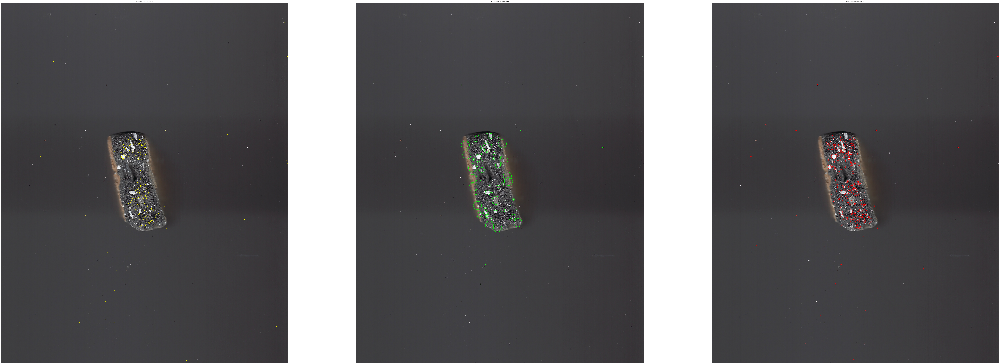

done


In [39]:

image = plt.imread('Ceramics_Images/Ceramic_13.jpeg')
image_gray = rgb2gray(image)

blobs_log = blob_log(image_gray, max_sigma=50, num_sigma=10, threshold=.4)
blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.4)
blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)
#process the sq
sq2 = sqrt(2)
# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sq2

blobs_dog[:, 2] = blobs_dog[:, 2] * sq2

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(120, 40), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()
print('done')
#fig.savefig('lowered_sensitivity_large.jpg')

In [40]:
len(blobs_dog)

75

In [14]:
image2 = plt.imread('Ceramics_Images/Ceramic_13.jpeg')
inclusion_counter(image2)

0

In [ ]:

dog_df = pd.DataFrame(data = blobs_dog, columns = ['x location of center', 'y location of center', 'radius (px)'])
dog_df.describe(include='all')

In [ ]:
doh_df = pd.DataFrame(data = blobs_doh, columns = ['x location of center', 'y location of center', 'radius (px)'])
doh_df.describe(include='all')

In [16]:

selem = disk(2)

##Run a blur on the image first because these scans seem to be too noisy


C:\ProgramData\Miniconda3\envs\huehue\lib\site-packages\IPython\core\interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


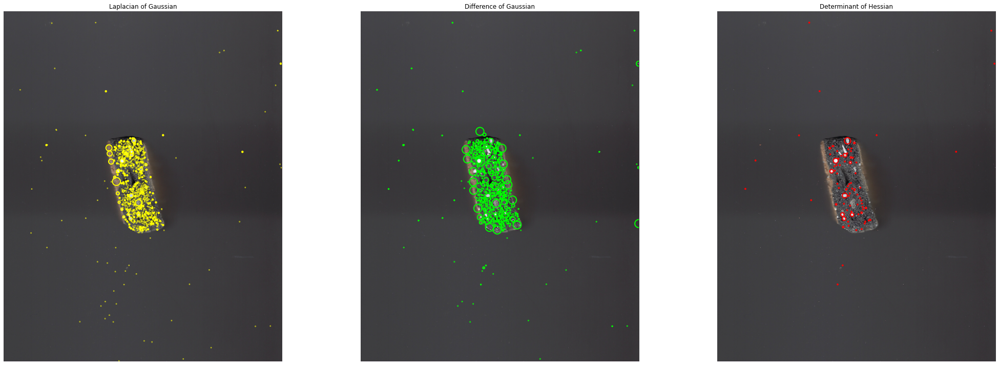

In [17]:
im2 = image
image_gray = rank.mean(rgb2gray(im2), selem = selem)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(30, 10), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(im2)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

DoH seems to have been over compensated, maybe we should adjust the settings of the blob detector, but DoG and LoG are still finding way too many small boobs where there aren't any. Perhaps adjust counter for a > < of radii? 

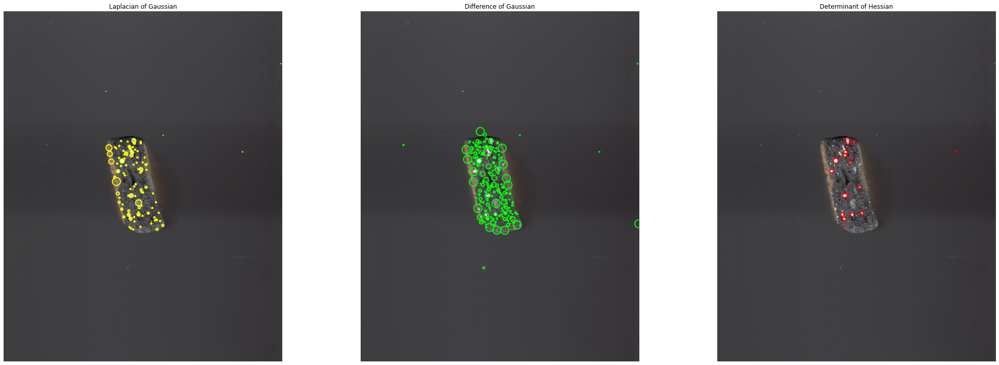

In [25]:
selem = disk(5)
im2 = image
image_gray = rank.median(rgb2gray(im2), selem = selem)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(30, 10), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(im2)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

In [18]:
from skimage.filters import laplace

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


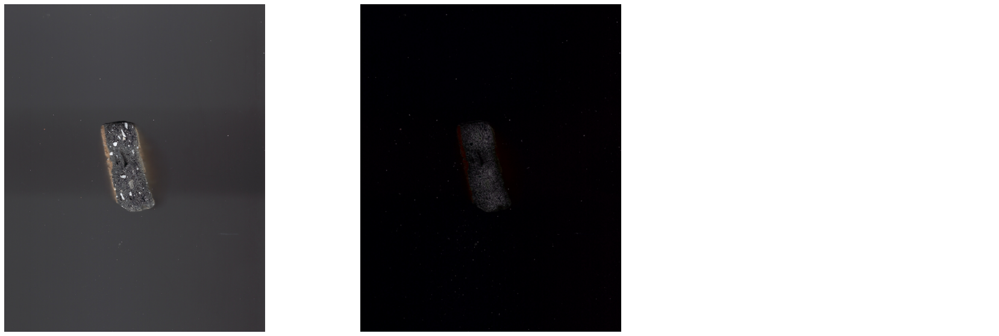

In [23]:
imlap = laplace(image,ksize=15)
fig, ax = plt.subplots(ncols=3, figsize=(30,10))
for a in ax:
    a.axis('off')
    
ax[0].imshow(image)
ax[1].imshow(imlap)

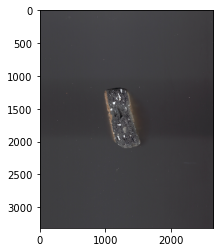

In [27]:
plt.imshow(image)

In [28]:
from skimage.filters import threshold_otsu

In [33]:
imageg = rgb2gray(image)
thresh = threshold_otsu(imageg)
binary = imageg > thresh


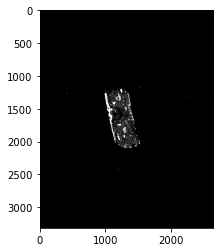

In [34]:
plt.imshow(binary,cmap=plt.cm.gray)

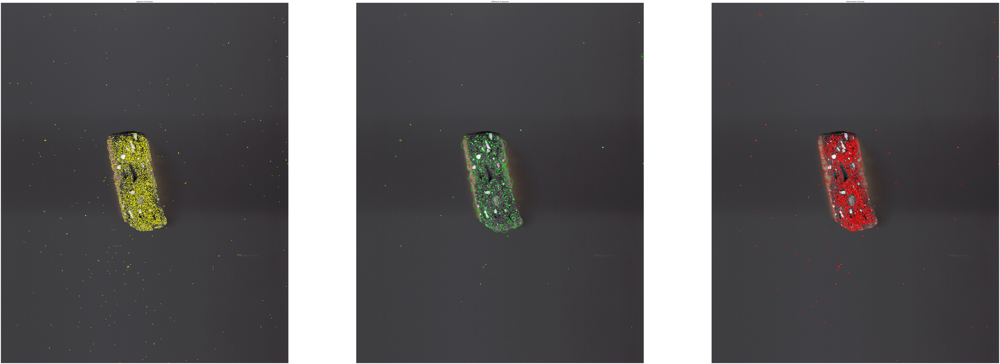

done


In [42]:
image_gray = binary

#blobs_log = blob_log(image_gray, max_sigma=50, num_sigma=10, threshold=.4)
#blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.4)
#blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)
#process the sq
#sq2 = sqrt(2)
# Compute radii in the 3rd column.
#blobs_log[:, 2] = blobs_log[:, 2] * sq2

#blobs_dog[:, 2] = blobs_dog[:, 2] * sq2

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(120, 40), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()
print('done')
fig.savefig('lowered_sensitivity_large.jpg')

In [38]:
len(blobs_dog)

366